#  IN3050/IN4050 Mandatory Assignment 1: Traveling Salesman Problem


## Rules
Before you begin the exercise, review the rules at this website:
https://www.uio.no/english/studies/examinations/compulsory-activities/mn-ifi-mandatory.html
(This is an individual assignment. You are not allowed to deliver together or copy/share source-code/answers
with others.)

Especially, notice that you are **not allowed to use code or parts of code written by others** in your submission. We do check your code against online repositories, so please be sure to **write all the code yourself**. Read also the "Routines for handling suspicion of cheating and attempted cheating at the University of Oslo": https://www.uio.no/english/studies/examinations/cheating/index.html By submitting this assignment, you confirm that you are familiar with the rules and the consequences of breaking them.

### Delivery

**Deadline**: Friday, February 24 2023, 23:59

Your submission should be delivered in Devilry. You may redeliver in Devilry before the deadline, but include all files in the last delivery, as only the last delivery will be read. You are recommended to upload preliminary versions hours (or days) before the final deadline.

### What to deliver?

You are recommended to solve the exercise in a Jupyter notebook, but you might solve it in a Python program if you prefer.

If you choose Jupyter, you should deliver the notebook. You should answer all questions and explain what you are doing in Markdown. Still, the code should be properly commented. The notebook should contain results of your runs. In addition, you should make a pdf of your solution which shows the results of the runs.

If you prefer not to use notebooks, you should deliver the code, your run results, and a pdf-report where you answer all the questions and explain your work.

Your report/notebook should contain your name and username.

Deliver one single zipped folder (.zip, .tgz or .tar.gz) which contains your complete solution.

Important: if you weren’t able to finish the assignment, use the PDF report/Markdown to elaborate on what you’ve tried and what problems you encountered. Students who have made an effort and attempted all parts of the assignment will get a second chance even if they fail initially. This exercise will be graded PASS/FAIL.

## Introduction
In this exercise, you will attempt to solve an instance of the traveling salesman problem (TSP) using different
methods. The goal is to become familiar with evolutionary algorithms and to appreciate their effectiveness on a
difficult search problem. You may use whichever programming language you like, but we strongly suggest that
you try to use Python, since you will be required to write the second assignment in Python. You must write
your program from scratch (but you may use non-EA-related libraries).


|  &nbsp;   | Barcelona | Belgrade |  Berlin | Brussels | Bucharest | Budapest |
|:---------:|:---------:|:--------:|:-------:|:--------:|:---------:|:--------:|
| Barcelona |     0     |  1528.13 | 1497.61 |  1062.89 |  1968.42  |  1498.79 |
|  Belgrade |  1528.13  |     0    |  999.25 |  1372.59 |   447.34  |  316.41  |
|   Berlin  |  1497.61  |  999.25  |    0    |  651.62  |  1293.40  |  1293.40 |
|  Brussels |  1062.89  |  1372.59 |  651.62 |     0    |  1769.69  |  1131.52 |
| Bucharest |  1968.42  |  447.34  | 1293.40 |  1769.69 |     0     |  639.77  |
|  Budapest |  1498.79  |  316.41  | 1293.40 |  1131.52 |   639.77  |     0    |


<center>Figure 1: First 6 cities from csv file.</center>


## Problem
The traveling salesman, wishing to disturb the residents of the major cities in some region of the world in
the shortest time possible, is faced with the problem of finding the shortest tour among the cities. A tour
is a path that starts in one city, visits all of the other cities, and then returns to the starting point. The
relevant pieces of information, then, are the cities and the distances between them. In this instance of the
TSP, a number of European cities are to be visited. Their relative distances are given in the data file, *european_cities.csv*, found in the zip file with the mandatory assignment.

(You will use permutations to represent tours in your programs. If you use Python, the **itertools** module provides
a permutations function that returns successive permutations, this is useful for exhaustive search)

## Helper code for visualizing solutions

Here follows some helper code that you can use to visualize the plans you generate. These visualizations can **help you check if you are making sensible tours or not**. The optimization algoritms below should hopefully find relatively nice looking tours, but perhaps with a few visible inefficiencies.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
#Map of Europe
europe_map =plt.imread('map.png')

#Lists of city coordinates
city_coords={"Barcelona":[2.154007, 41.390205], "Belgrade": [20.46,44.79], "Berlin": [13.40,52.52], "Brussels":[4.35,50.85],"Bucharest":[26.10,44.44], "Budapest": [19.04,47.50], "Copenhagen":[12.57,55.68], "Dublin":[-6.27,53.35], "Hamburg": [9.99, 53.55], "Istanbul": [28.98, 41.02], "Kiev": [30.52,50.45], "London": [-0.12,51.51], "Madrid": [-3.70,40.42], "Milan":[9.19,45.46], "Moscow": [37.62,55.75], "Munich": [11.58,48.14], "Paris":[2.35,48.86], "Prague":[14.42,50.07], "Rome": [12.50,41.90], "Saint Petersburg": [30.31,59.94], "Sofia":[23.32,42.70], "Stockholm": [18.06,60.33],"Vienna":[16.36,48.21],"Warsaw":[21.02,52.24]}

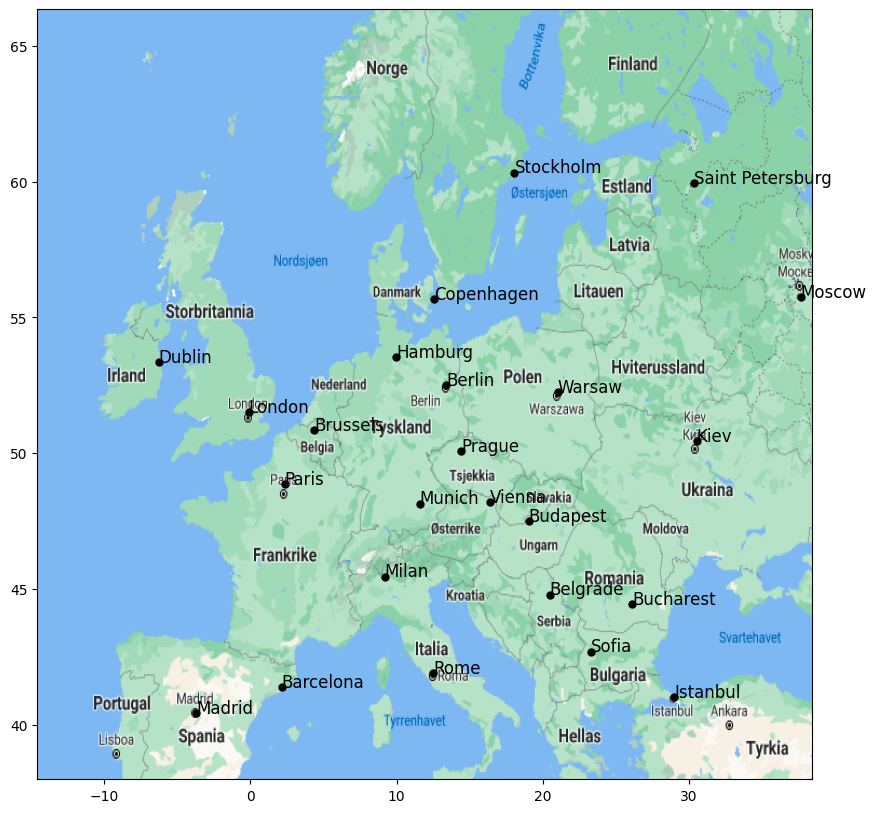

In [2]:
#Helper code for plotting plans
#First, visualizing the cities.
import csv
with open("european_cities.csv", "r") as f:
    data = list(csv.reader(f, delimiter=';'))
    cities = data[0]
    
fig, ax = plt.subplots(figsize=(10,10))

ax.imshow(europe_map, extent=[-14.56,38.43, 37.697 +0.3 , 64.344 +2.0], aspect = "auto")



# Map (long, lat) to (x, y) for plotting
for city,location in city_coords.items():
    x, y = (location[0], location[1])
    plt.plot(x, y, 'ok', markersize=5)
    plt.text(x, y, city, fontsize=12)

In [3]:
#A method you can use to plot your plan on the map.
def plot_plan(city_order,Score):
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(europe_map, extent=[-14.56,38.43, 37.697 +0.3 , 64.344 +2.0], aspect = "auto")

    # Map (long, lat) to (x, y) for plotting
    for index in range(len(city_order) -1):
        current_city_coords = city_coords[city_order[index]]
        next_city_coords = city_coords[city_order[index+1]]
        x, y = current_city_coords[0], current_city_coords[1]
        #Plotting a line to the next city
        next_x, next_y = next_city_coords[0], next_city_coords[1]
        plt.plot([x,next_x], [y,next_y])
        
        plt.plot(x, y, 'ok', markersize=5)
        plt.text(x, y, index, fontsize=12);
    #Finally, plotting from last to first city
    first_city_coords = city_coords[city_order[0]]
    first_x, first_y = first_city_coords[0], first_city_coords[1]
    plt.plot([next_x,first_x],[next_y,first_y])
    #Plotting a marker and index for the final city
    plt.plot(next_x, next_y, 'ok', markersize=5)
    plt.text(next_x, next_y, index+1, fontsize=12)
    plt.title(Score)
    plt.show()

## Exhaustive Search
First, try to solve the problem by inspecting every possible tour. Start by writing a program to find the shortest
tour among a subset of the cities (say, **6** of them). Measure the amount of time your program takes. Incrementally
add more cities and observe how the time increases. Plot the shortest tours you found using the plot_plan method above, for 6 and 10 cities.

In [5]:
#Import packages
from itertools import permutations
from math import sqrt
import time
import numpy as np
import matplotlib.pyplot as plt
import copy

In [10]:
city_coords={"Barcelona":[2.154007, 41.390205], "Belgrade": [20.46,44.79], "Berlin": [13.40,52.52], "Brussels":[4.35,50.85],"Bucharest":[26.10,44.44], "Budapest": [19.04,47.50], "Copenhagen":[12.57,55.68], "Dublin":[-6.27,53.35], "Hamburg": [9.99, 53.55], "Istanbul": [28.98, 41.02], "Kiev": [30.52,50.45], "London": [-0.12,51.51], "Madrid": [-3.70,40.42], "Milan":[9.19,45.46], "Moscow": [37.62,55.75], "Munich": [11.58,48.14], "Paris":[2.35,48.86], "Prague":[14.42,50.07], "Rome": [12.50,41.90], "Saint Petersburg": [30.31,59.94], "Sofia":[23.32,42.70], "Stockholm": [18.06,60.33],"Vienna":[16.36,48.21],"Warsaw":[21.02,52.24]}
#Create function that generates X amounts of permutations from city_coords
def gen_solution(perms):
    cities = list(city_coords.keys())
    cities = cities[:perms]
    city_order = list(permutations(cities))
    Nu_city_order = list()
    for order in city_order:
        order = list(order)
        first_cit = order[0]
        order.append(first_cit)
        Nu_city_order.append(order)
    return Nu_city_order

#Call the previous function and loop through all permutations in city_order to find the lowest distance traveled
def best_solution(city_order):
    Best_dist = 1000000
    best_city = []
    for order in city_order:
        d1 = 0
        for city_idx in range(0,len(order)-1):
            x1,y1 = city_coords.get(order[city_idx])
            x2,y2 = city_coords.get(order[city_idx+1])
            g=sqrt(((x2-x1)**2)+((y2-y1)**2))
            d1 = d1 + g
        if d1 < Best_dist:
            Best_dist = d1*1
            best_city = copy.deepcopy(order)
    Best_dist = round(Best_dist,2)
    return best_city, Best_dist

The algorithm took 0.0020062923431396484 seconds for population size 6
The algorithm took 16.131368398666382 seconds for population size 10


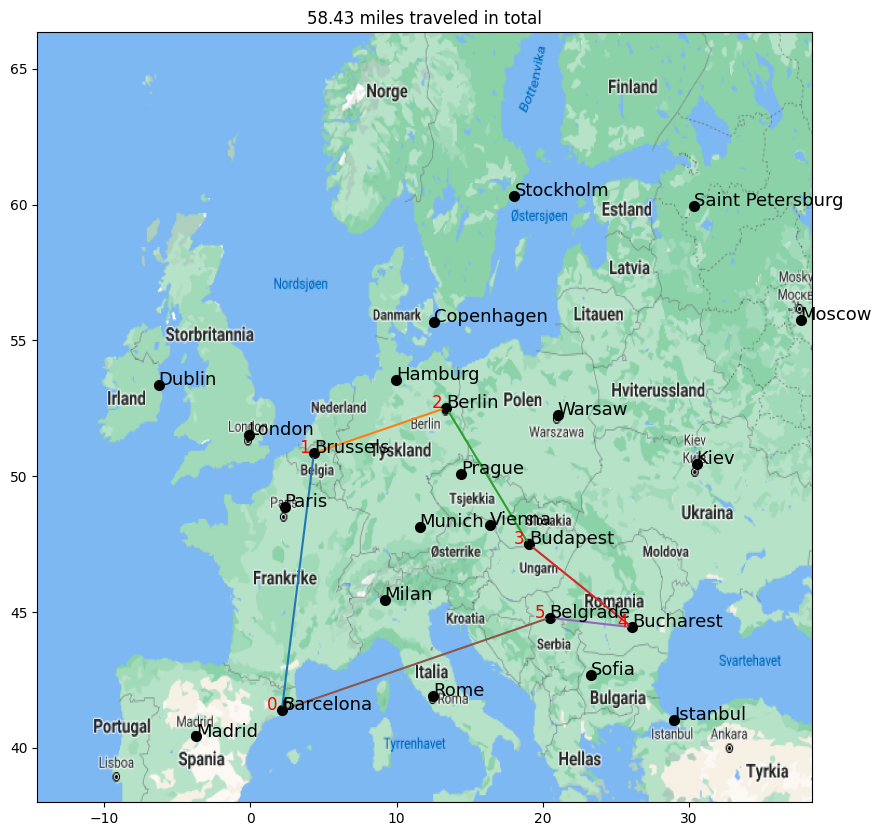

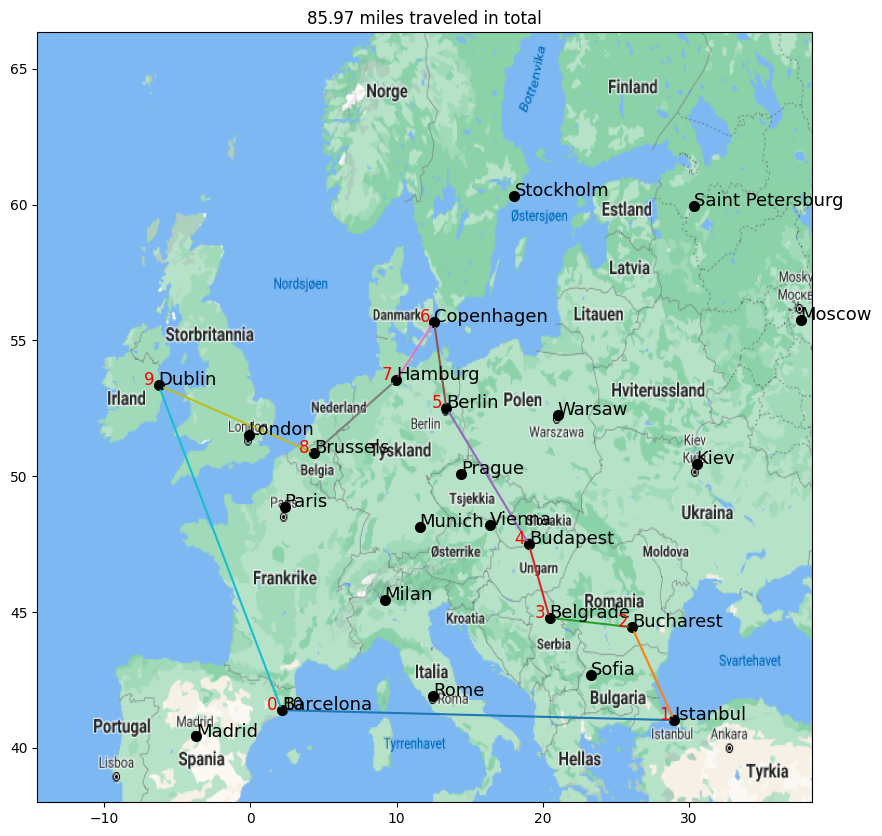

In [13]:
# Plotting results: 

def plot_plan(city_order,Best_distance):
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(europe_map, extent=[-14.56,38.43, 37.697 +0.3 , 64.344 +2.0], aspect = "auto")
    # Map (long, lat) to (x, y) for plotting
    for city,location in city_coords.items():
        x, y = (location[0], location[1])
        plt.plot(x, y, 'ok', markersize=7)
        plt.text(x, y, city, fontsize=13)
    # Plot route
    for index in range(len(city_order)-1):
        current_city_coords = city_coords[city_order[index]]
        next_city_coords = city_coords[city_order[index+1]]
        x, y = current_city_coords[0], current_city_coords[1]
        #Plotting a line to the next city
        next_x, next_y = next_city_coords[0], next_city_coords[1]
        plt.plot([x,next_x], [y,next_y])
        
        plt.plot(x, y, 'ok', markersize=5)
        plt.text(x-1, y, index, fontsize=12, color="red")
    #Finally, plotting from last to first city
    first_city_coords = city_coords[city_order[0]]
    first_x, first_y = first_city_coords[0], first_city_coords[1]
    plt.plot([next_x,first_x],[next_y,first_y])
    #Plotting a marker and index for the final city
    plt.plot(next_x, next_y, 'ok', markersize=5)
    plt.text(next_x, next_y, index+1, fontsize=12)
    plt.title(f"{Best_distance} miles traveled in total")
    plt.show()
x, y = 6, 10
s1 = time.time()
bst_route, bst_dist = best_solution(gen_solution(x))
s2 = time.time()
runtime = s2-s1
print(f"The algorithm took {runtime} seconds for population size {x}")
s1 = time.time()
bst_route2, bst_dist2 = best_solution(gen_solution(y))
s2 = time.time()
runtime =  s2-s1
print(f"The algorithm took {runtime} seconds for population size {y}")
plot_plan(bst_route,bst_dist)
plot_plan(bst_route2, bst_dist2)

What is the shortest tour (i.e., the actual sequence of cities, and its length) among the first 10 cities (that is,
the cities starting with B,C,D,H and I)? How long did your program take to find it? Calculate an approximation of how long it would take to perform exhaustive search on all 24 cities?

In [ ]:
# The shortest tour among the first 10 cities are: ('Istanbul', 'Bucharest', 'Belgrade', 'Budapest', 'Berlin', 'Copenhagen', 'Hamburg', 'Brussels', 
# 'Barcelona', 'Dublin')
# This took my program 19.7068 seconds to find.
# Based on the following formula for number of permutations: if n = r, then Time = n!, we get 6.204484017E + 23 or 
# 620448401733239439360000 possible permutations. I plotted the data in geogebra and tried to plot a function for the time taken per n cities added. 
# I ended up with the function 10.5^(x-8.66) which neatly fit the data up to 11 cities. Based on the function, it would take 4624277071939502 seconds or 
# 146 634 864 years or 146 634 millenia to finish the algorithm. 

## Hill Climbing
Then, write a simple hill climber to solve the TSP. How well does the hill climber perform, compared to the result from the exhaustive search for the first **10 cities**? Since you are dealing with a stochastic algorithm, you
should run the algorithm several times to measure its performance. Report the length of the tour of the best,
worst and mean of 20 runs (with random starting tours), as well as the standard deviation of the runs, both with the **10 first cities**, and with all **24 cities**. Plot one of the the plans from the 20 runs for both 10 cities and 24 cities (you can use plot_plan). 

For 1000 number of iterations, the algorithm achieved the following:
The best solution had distance: 62.9 and will be plotted below
The worst solution had distance: 158.76 and will also be plotted below
The average distance was: 108.82 with SD: 17.12


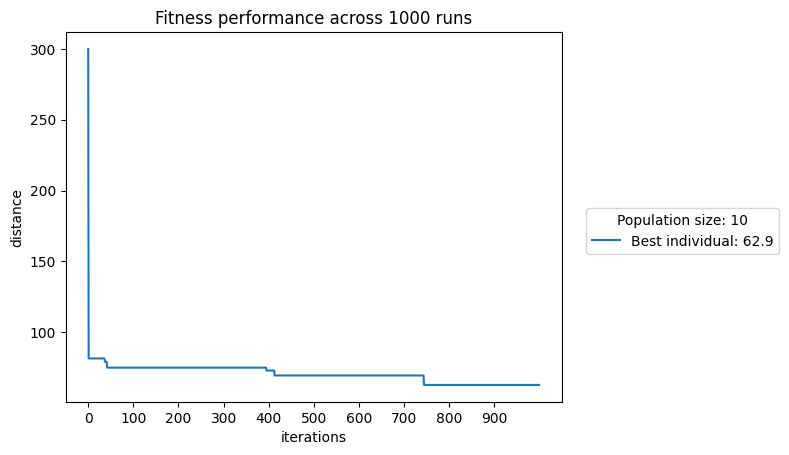

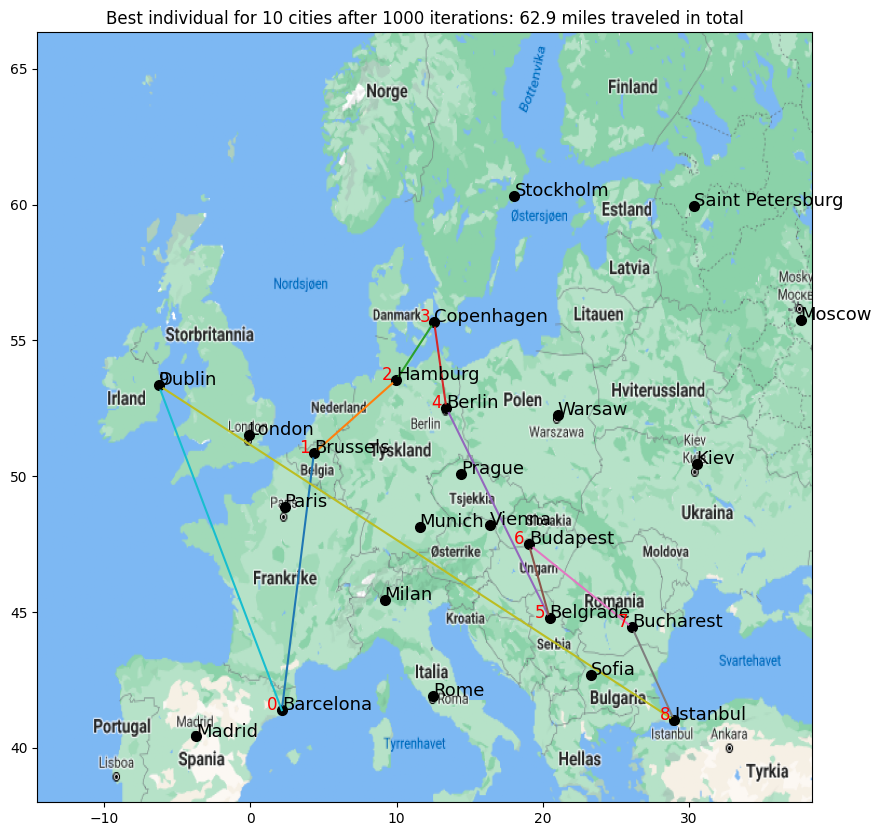

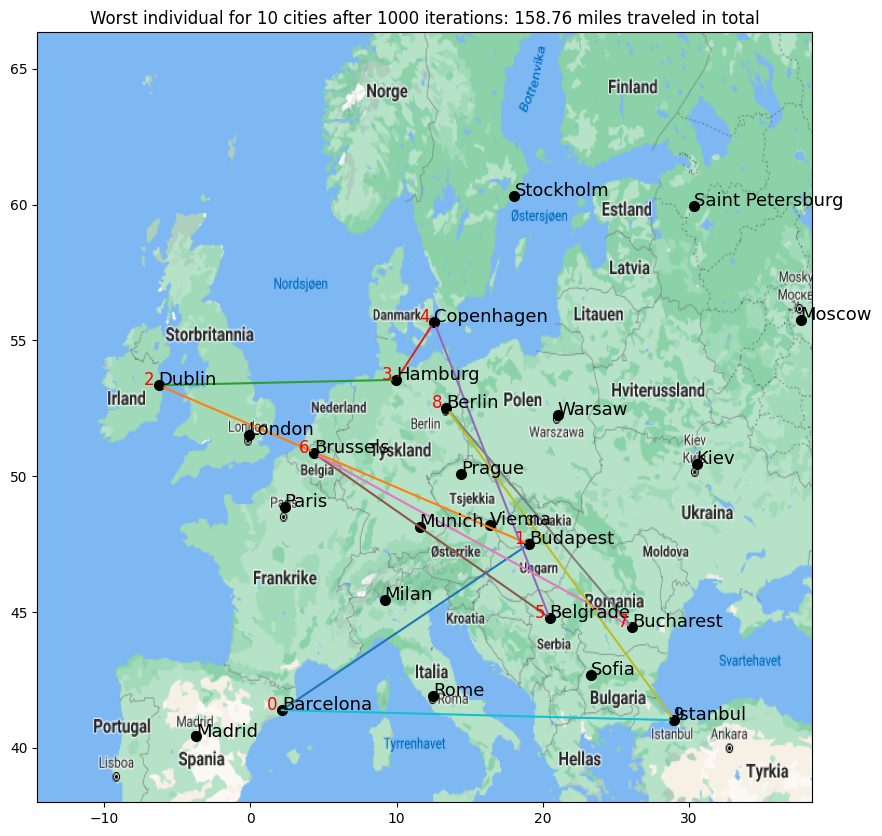

For 1000 number of iterations, the algorithm achieved the following:
The best solution had distance: 194.93 and will be plotted below
The worst solution had distance: 397.84 and will also be plotted below
The average distance was: 287.31 with SD: 29.6


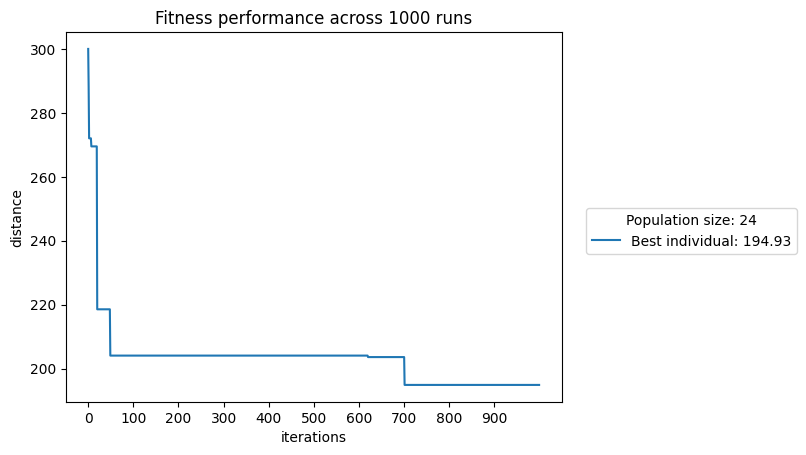

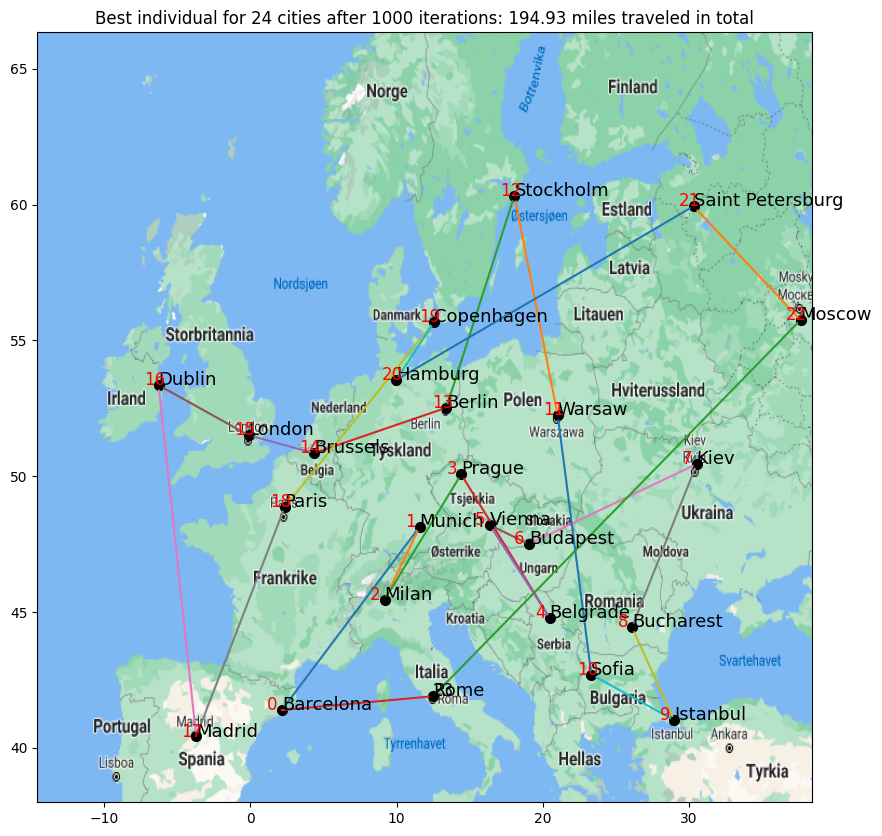

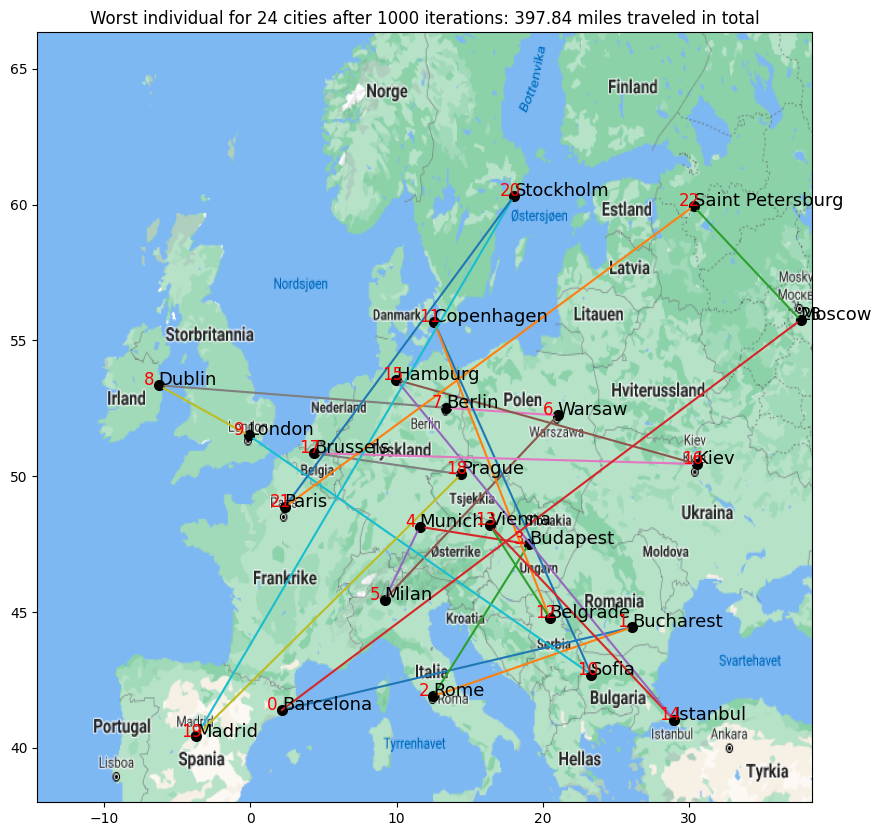

In [15]:
import numpy as np
from math import sqrt
import matplotlib.pyplot as plt
import random
import statistics
#Map of Europe
europe_map = plt.imread('map.png')

#Lists of city coordinates
city_coords={"Barcelona":[2.154007, 41.390205], "Belgrade": [20.46,44.79], "Berlin": [13.40,52.52], "Brussels":[4.35,50.85],"Bucharest":[26.10,44.44], "Budapest": [19.04,47.50], "Copenhagen":[12.57,55.68], "Dublin":[-6.27,53.35], "Hamburg": [9.99, 53.55], "Istanbul": [28.98, 41.02], "Kiev": [30.52,50.45], "London": [-0.12,51.51], "Madrid": [-3.70,40.42], "Milan":[9.19,45.46], "Moscow": [37.62,55.75], "Munich": [11.58,48.14], "Paris":[2.35,48.86], "Prague":[14.42,50.07], "Rome": [12.50,41.90], "Saint Petersburg": [30.31,59.94], "Sofia":[23.32,42.70], "Stockholm": [18.06,60.33],"Vienna":[16.36,48.21],"Warsaw":[21.02,52.24]}

# Simple hill climber 
def stochastic_hill_climber(Num_cities,iterations):
    # Define the fitness function
    def fitness(current_city,nu_city):
        x1,y1 = city_coords.get(current_city)
        x2,y2 = city_coords.get(nu_city)
        return sqrt(((x2-x1)**2)+((y2-y1)**2))
    # Find the closest neighbours and shortest overall tour
    def find_best_solution(iterations):
        all_best_seqs = list()
        best_d = [300]
        for _1 in range(1,iterations):
            cities = list(city_coords.keys())
            cities = cities[:Num_cities]
            Start_city = cities[0]
            cities2 = cities
            cities2.remove(Start_city)
            Current_city = Start_city
            best_seq = [Start_city]
            d1 = 0
            Rand_nxt_city = cities[random.randint(0,len(cities)-1)] 
            for _3 in range(0,len(cities2)-1):
                Rand_dist = fitness(Start_city,Rand_nxt_city)
                best_options = list()
                for nxt_city in cities2:
                    dist = fitness(Current_city,nxt_city)
                    if dist < Rand_dist:
                        best_options.append(nxt_city)
                if len(best_options) == 0:
                    best_options.append(Rand_nxt_city)
                Neighbour = random.choice(best_options)
                best_seq.append(Neighbour)
                dst = fitness(Current_city,Neighbour)
                d1 = d1 + dst
                Current_city = Neighbour
                cities2.remove(Neighbour)
                Rand_nxt_city = cities2[random.randint(0,len(cities2)-1)]
                if len(cities2) == 1:
                    best_seq.append(cities2[0])
            d1 = d1 + fitness(Start_city,cities2[0])
            best_d_yet = best_d[-1]
            if d1 < best_d_yet:
                best_d.append(d1)
            else:
                best_d.append(best_d[-1])
            all_best_seqs.append([d1,best_seq])
        all_best_seqs.sort(key = lambda x: x[0])
        best_seq = all_best_seqs[0]
        best_seq_scr = round(all_best_seqs[0][0],2)
        worst_seq = all_best_seqs[-1]
        worst_seq_scr = round(all_best_seqs[-1][0],2)
        dist_scrs = [sublist[0] for sublist in all_best_seqs]
        Mean_seq_score = round(statistics.mean(dist_scrs),2)
        Std_seq_score = round(statistics.stdev(dist_scrs),2)
        return best_seq_scr, best_seq, worst_seq_scr, worst_seq, Mean_seq_score, Std_seq_score, best_d 
    return find_best_solution(iterations)

def plot_iters(best_d,best_seq_scr,sz,iterations):
    x = list(range(0,len(best_d)))
    plt.plot(x, best_d, label=f"Best individual: {best_seq_scr}")
    plt.ylabel('distance')
    plt.xlabel('iterations')
    space = len(x)//10
    plt.xticks(x[::space])
    plt.title(f"Fitness performance across {iterations} runs")
    plt.legend(loc=(1.05,0.4),title=f"Population size: {sz}")
    plt.show()
    return

def IterateAndVisualize(size1,size2,iterations):
    sizes = [size1,size2]
    for sz in sizes:
        best_seq_scr, best_seq, worst_seq_scr, worst_seq, Mean_seq_score, Std_seq_score, best_d  = stochastic_hill_climber(sz,iterations)
        print(f"For {iterations} number of iterations, the algorithm achieved the following:")
        print(f"The best solution had distance: {best_seq_scr} and will be plotted below")
        print(f"The worst solution had distance: {worst_seq_scr} and will also be plotted below")
        print(f"The average distance was: {Mean_seq_score} with SD: {Std_seq_score}")
        plot_iters(best_d,best_seq_scr,sz,iterations)
        plot_plan(best_seq[1],f"Best individual for {sz} cities after {iterations} iterations: {best_seq_scr}")
        plot_plan(worst_seq[1],f"Worst individual for {sz} cities after {iterations} iterations: {worst_seq_scr}")
    return

IterateAndVisualize(10,24,1000)


In [16]:
import numpy as np
import statistics
import random
import sys
import math
import matplotlib.pyplot as plt
import time

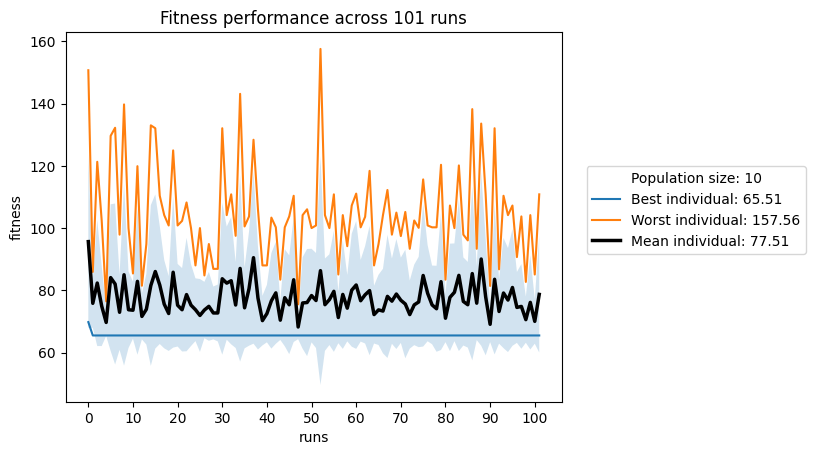

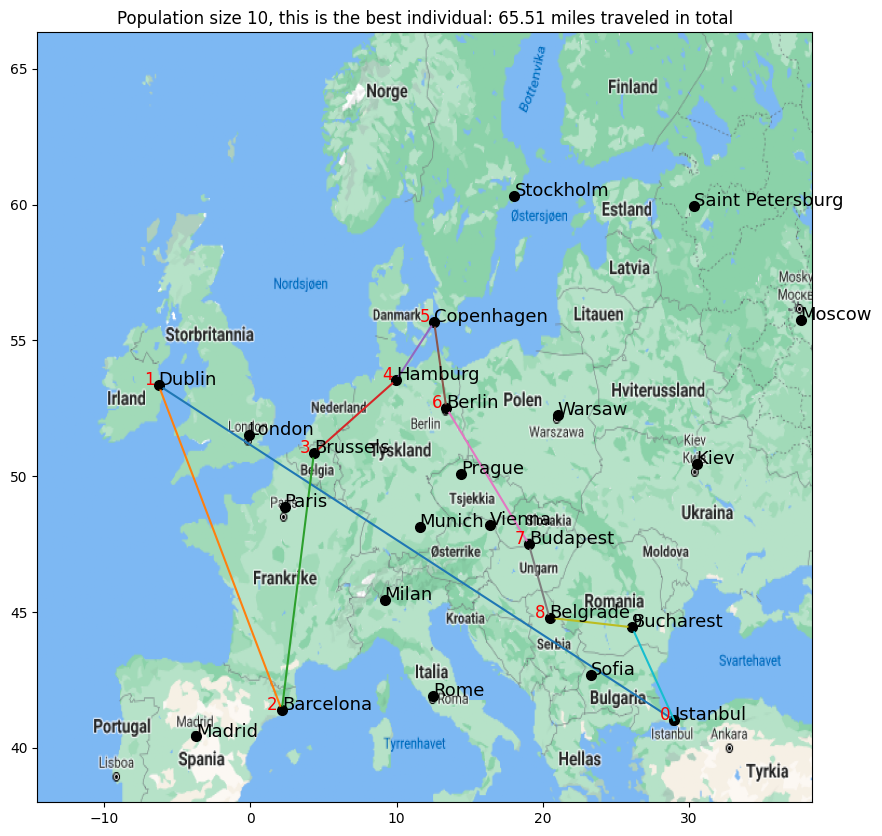

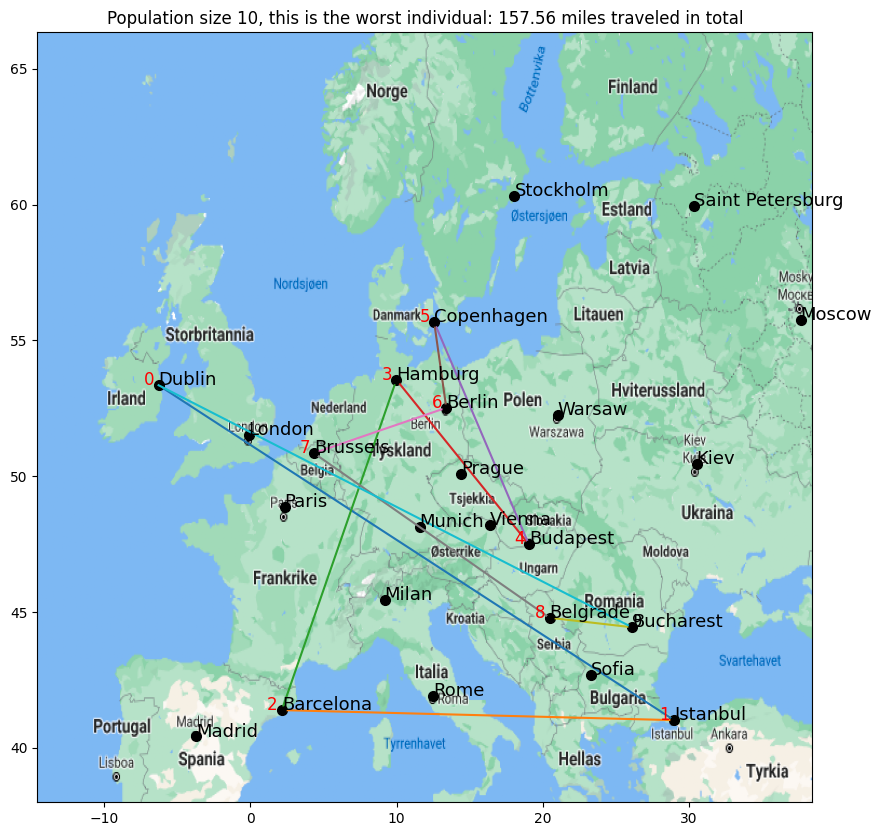

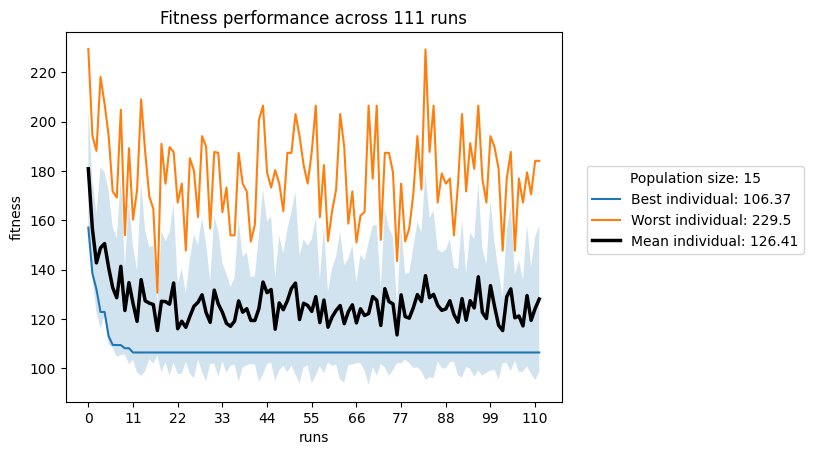

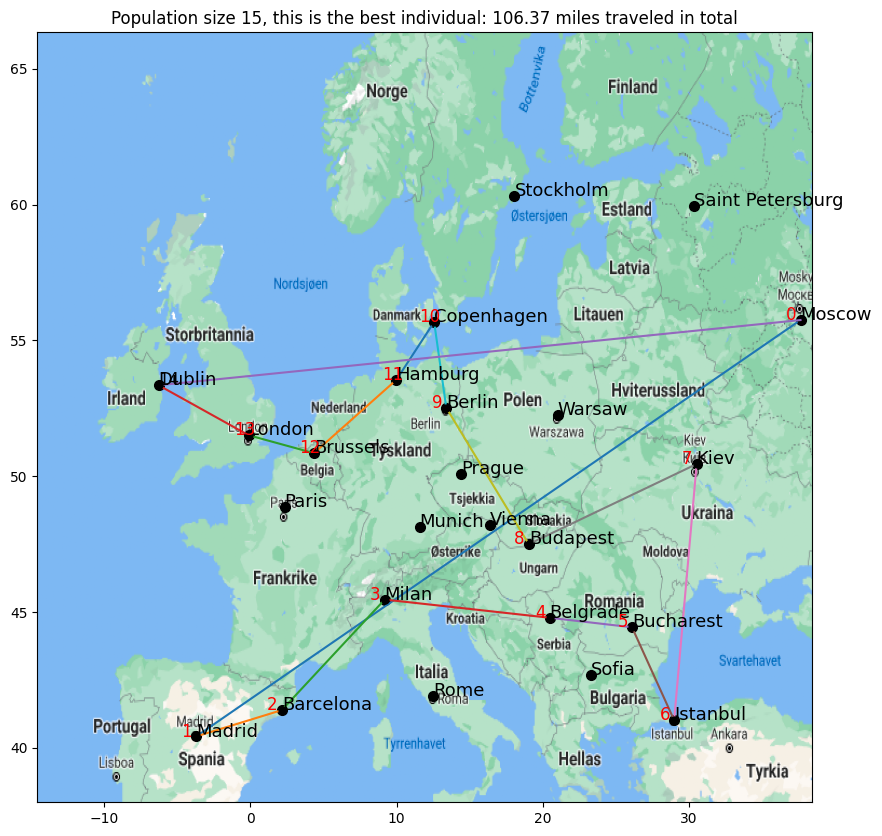

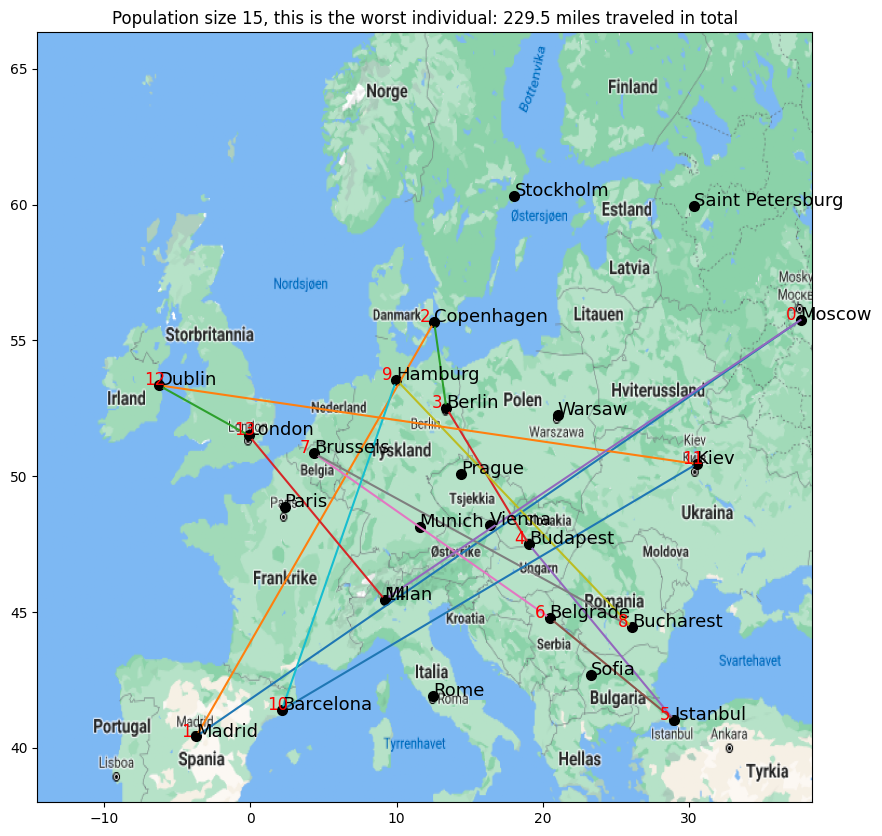

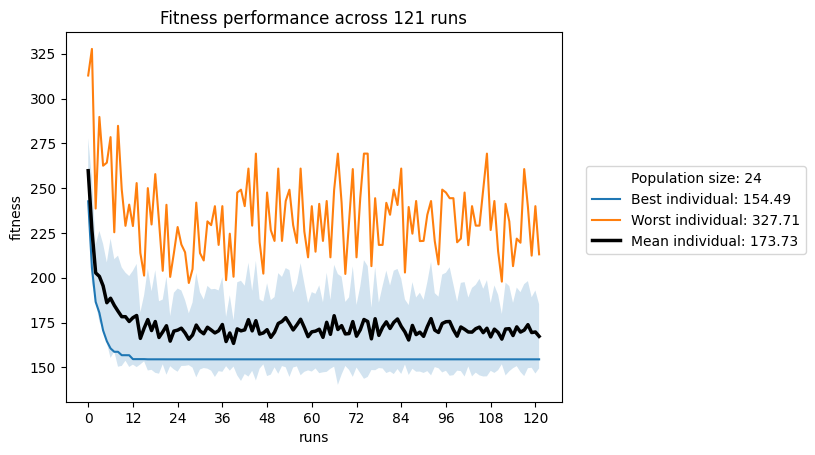

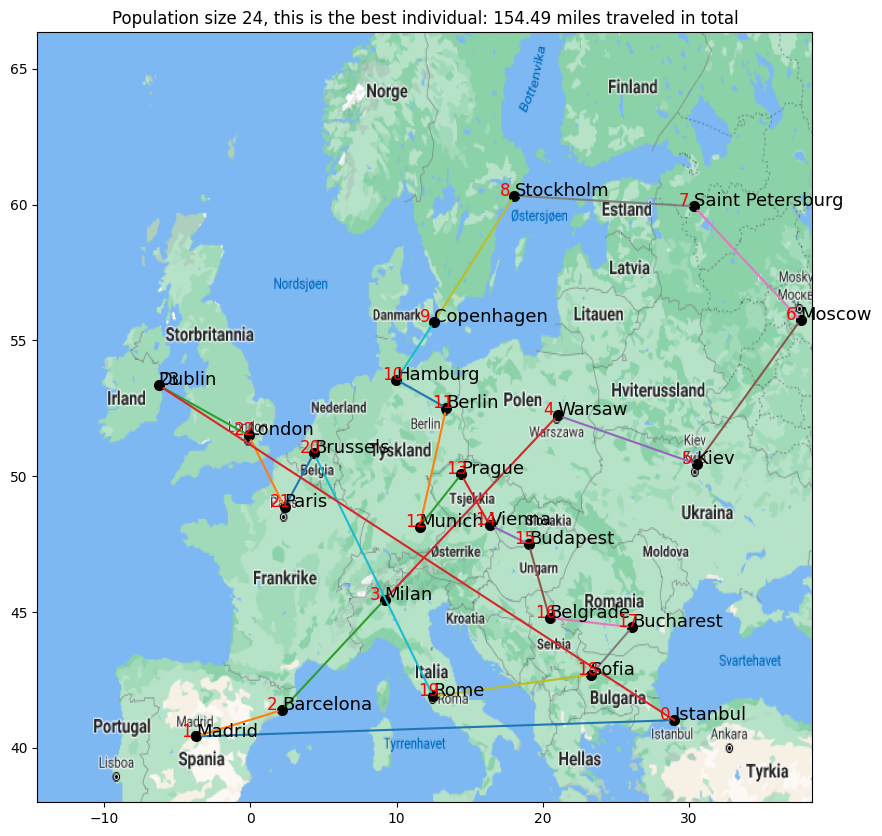

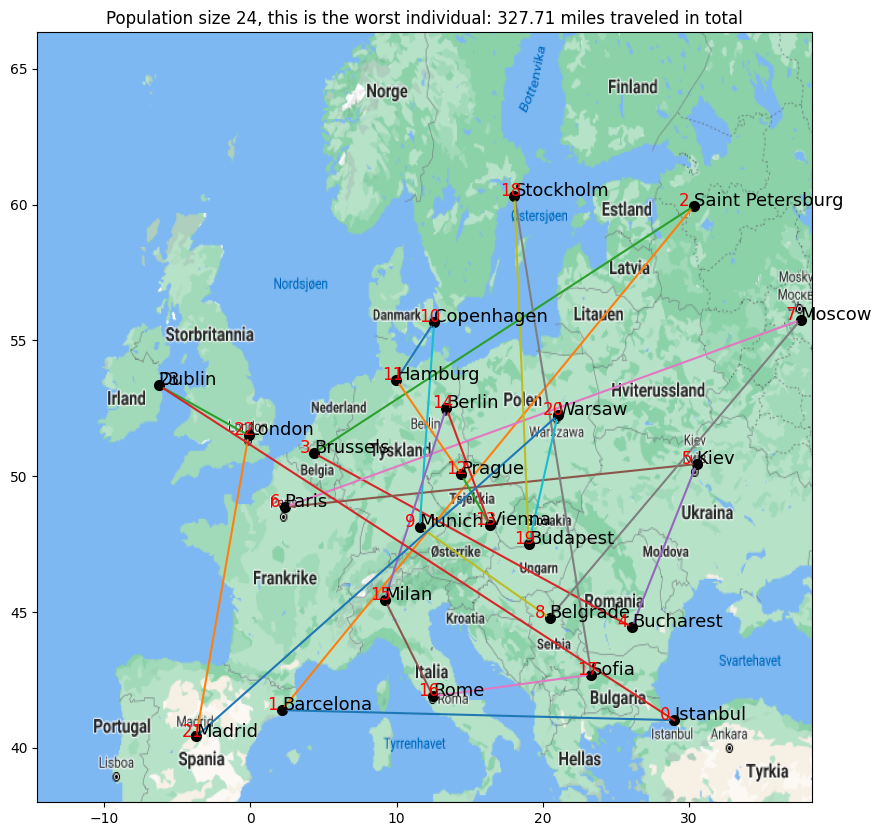

In [22]:
#Map of Europe
europe_map =plt.imread('map.png')

#Lists of city coordinates
city_coords={"Barcelona":[2.154007, 41.390205], "Belgrade": [20.46,44.79], "Berlin": [13.40,52.52], "Brussels":[4.35,50.85],"Bucharest":[26.10,44.44], "Budapest": [19.04,47.50], "Copenhagen":[12.57,55.68], "Dublin":[-6.27,53.35], "Hamburg": [9.99, 53.55], "Istanbul": [28.98, 41.02], "Kiev": [30.52,50.45], "London": [-0.12,51.51], "Madrid": [-3.70,40.42], "Milan":[9.19,45.46], "Moscow": [37.62,55.75], "Munich": [11.58,48.14], "Paris":[2.35,48.86], "Prague":[14.42,50.07], "Rome": [12.50,41.90], "Saint Petersburg": [30.31,59.94], "Sofia":[23.32,42.70], "Stockholm": [18.06,60.33],"Vienna":[16.36,48.21],"Warsaw":[21.02,52.24]}

# Evaluate fitness of individual
def fitness(Individual):
    Total_dist = 0
    for gene_idx in range(1,len(Individual)-1):
        x1,y1 = city_coords.get(Individual[gene_idx])
        x2,y2 = city_coords.get(Individual[gene_idx+1])
        Distance = math.sqrt((x2-x1)**2 + (y2-y1)**2)
        Total_dist = Total_dist + Distance
    #Add the last position with the first to get the entire route
    x1,y1 = city_coords.get(Individual[len(Individual)-1])
    y1,y2 = city_coords.get(Individual[0])
    Distance = math.sqrt((x2-x1)**2 + (y2-y1)**2)
    Total_dist = Total_dist + Distance
    return round(Total_dist,2)

# Random generation of population of solution sets
def Starting_population(Size):
    cities = list(city_coords.keys())[:Size]
    population = []
    while len(population) < Size:
        new_combination = list(random.sample(cities, len(cities)))
        if new_combination not in population:
            population.append(new_combination)
    # Assign values that determine prob of becoming parent based on rank
    for Individual in range(0,len(population)):
        fitness_scr = fitness(population[Individual])
        population[Individual] = [fitness_scr,population[Individual]]
    population.sort(key = lambda x: x[0])
    return population

# Generate parents with order selection probability
def Select_parents(population):
    # Define probability to create order
    parents = []
    idx = 0
    while len(parents) <= len(population)//2:
        prob_select = 0.9
        x = random.random()
        if x < prob_select:
            parent1 = population[idx]
            parents.append(parent1)
            if parent1 == population[idx+1]:
                parent2 = population[idx+2]
                parents.append(parent2)
            parents.append(population[idx+1])
        if len(parents) >= len(population)//2:
            break
        idx = idx + 2
        if idx >= len(population)-2:
            idx = 0
    #Considering to add semi-sorted list, so that parental mating is somewhat linked to rank, with some randomness
    return parents

def PMX(parent1, parent2, change_size): # THIS FUNCTION WAS RETRIEVED FROM WEEK 3 EXERCISE FOR PARTIALLY MAPPED CROSSOVER
    #Create offspring genome and their respective slicing indices based on percentage of parental size
    idx_start = np.random.randint(0,len(parent1)-(math.ceil(len(parent1)*change_size))-1)
    if idx_start+1 >= ((idx_start+math.ceil(len(parent1)*change_size))+1):
        idx_stop = (idx_start+math.ceil(len(parent1)*change_size))+1
    else:
        idx_stop = np.random.randint((idx_start + 1),(idx_start+math.ceil(len(parent1)*change_size))+1)
    #Create a relation list that contains the relation between all the middle values
    relations = []
    for y in range(idx_start,idx_stop+1):
        relations.append([parent1[y],parent2[y]]) 
    offspring1 = [0] * len(parent1)
    offspring2 = offspring1.copy()
    offspring1[idx_start:idx_stop+1] = parent2[idx_start:idx_stop+1]
    offspring2[idx_start:idx_stop+1] = parent1[idx_start:idx_stop+1]
    idx_list = list(range(0,len(parent1)))
    del idx_list[idx_start:idx_stop+1]
    #Create a function that searches through an array to find the index of the value
    def get_index(val,p):
        for x in range(0,len(relations)):
            if relations[x][p] == val:
                return x
    #Create a function that loops through elements in the other parent and check if it overlaps with the values from the primary parent
    def crossover(offspring):
        #Check if it is p1 or p2:
        if [k for k, v in sys._getframe(1).f_locals.items() if v is offspring][0] == "offspring1":
            p = 0
            parent = parent1
        else:
            p = 1
            parent =  parent2  
        for u in idx_list:
            if parent[u] in offspring:
                p1 = abs(p-1)
                idx = get_index(parent[u],p1)
                if idx != None:
                    if relations[idx][p] not in offspring:
                        offspring[u] = relations[idx][p]
                    else:
                        for _ in range(len(parent1)-(idx_stop-idx_start)):
                            idx = get_index(relations[idx][p],p1)
                            if idx != None:
                                if relations[idx][p] not in offspring:
                                    offspring[u] = relations[idx][p]
                                    break
                            else:
                                break
            elif parent[u] not in offspring:
                offspring[u] = parent[u]
        return offspring
        
    offspring1 = crossover(offspring1)
    offspring2 = crossover(offspring2)
    def swap_random(ls):
        idx = range(len(ls))
        i1, i2 = random.sample(idx, 2)
        ls[i1], ls[i2] = ls[i2], ls[i1]
        return ls
    offspring1 = swap_random(offspring1)
    offspring2 = swap_random(offspring2)
    return offspring1, offspring2

def CrossAndMutate(parents,x):
    offsprings = []
    random.shuffle(parents)
    for parent_idx in range(0,len(parents)-1,2):
        parent1 = parents[parent_idx]
        parent2 = parents[parent_idx+1]
        offspring1, offspring2 = PMX(parent1[1],parent2[1],x)
        offspring1 = [fitness(offspring1),offspring1]
        offspring2 = [fitness(offspring2),offspring2]
        offsprings.append(offspring1)
        offsprings.append(offspring2)
    return offsprings

def SurvivorSelection(population,offsprings,size):
    offsprings.sort(key = lambda x: x[0])
    population.sort(key = lambda x: x[0])
    if len(population) % 2 == 0:
        lim1 = len(population) // 2
        lim2 = len(population) // 2
    else:
        lim1 = len(population) // 2 + 1
        lim2 = len(population) // 2 
    offsprings = offsprings[:lim1]
    population = population[:lim2]
    population = population + offsprings
    population.sort(key = lambda x: x[0])
    return population 

def Generations(size,Gens_limit):
    s1 = time.time()
    population1 = Starting_population(size)
    #Define temperature function to create less change in PMX over generations
    Best_individuals_fit = list()
    Worst_individuals_fit = list()
    All_worst_performer = [0,["t"]]
    Avg_performer_fit = list()
    Std_performer_fit = list()
    Average_fit = list()
    Std_fit = list()
    for run in range(0,10000):
        x = 0.5
        each_bit = 0.4/Gens_limit     
        for gen in range(0,Gens_limit):
            parents = Select_parents(population1)   
            offsprings = CrossAndMutate(parents,x)
            population1 = SurvivorSelection(population1,offsprings,size)
            Top_performer_fit = population1[0][0]
            Worst_performer_fit = population1[len(population1)-1][0]
            values = [sublist[0] for sublist in population1]
            Avg_performer_fit = round(statistics.mean(values),2)
            Std_performer_fit = round(statistics.stdev(values),2)
            x = x-each_bit
        Worst_performer = population1[len(population1)-1]
        if Worst_performer[0] > All_worst_performer[0]:
            All_worst_performer = Worst_performer
        Best_performer = population1[0]
        Average_fit.append(Avg_performer_fit)
        Best_individuals_fit.append(Top_performer_fit)
        Worst_individuals_fit.append(Worst_performer_fit)
        Std_fit.append(Std_performer_fit)
        if Best_individuals_fit.count(Top_performer_fit) > 100:
            break
    s2 = time.time()
    runtime = s2-s1
    return All_worst_performer, Best_performer, Average_fit, Best_individuals_fit, Worst_individuals_fit, Std_fit, runtime

def plot_runs(Best_individuals_fit,Average_fit,Std_fit,Worst_individuals_fit,sz):
    x = list(range(0,len(Best_individuals_fit)))
    Best = min(Best_individuals_fit)
    Worst = max(Worst_individuals_fit)
    Avg = round(statistics.mean(Average_fit),2)
    plt.plot(x, Best_individuals_fit, label=f"Best individual: {Best}")
    plt.plot(x, Worst_individuals_fit, label=f"Worst individual: {Worst}")
    plt.plot(x, Average_fit, label = f"Mean individual: {Avg}",color='black',linewidth=2.5)
    upper = list()
    lower = list()
    for id in range(0,len(Std_fit)):
        upper.append(Average_fit[id]+Std_fit[id])
        lower.append(Average_fit[id]-Std_fit[id])
    # Plot the mean and standard deviation as a shaded area
    plt.fill_between(x, upper, lower, alpha=0.2)
    plt.ylabel('fitness')
    plt.xlabel('runs')
    space = len(x)//10
    plt.xticks(x[::space])
    plt.title(f"Fitness performance across {len(Best_individuals_fit)-1} runs")
    plt.legend(loc=(1.05,0.4),title=f"Population size: {sz}")
    plt.show()
    return

def RunAndPlot(size1,size2,size3,runs):
    sizes = [size1,size2,size3]
    for sz in sizes:
        Worst_performer, Best_performer, Average_fit, Best_individuals_fit, Worst_individuals_fit, Std_fit, runtime = Generations(sz,runs)
        #print(f"The algorithm took {runtime} seconds")
        plot_runs(Best_individuals_fit,Average_fit,Std_fit,Worst_individuals_fit,sz)
        plot_plan(Best_performer[1],f"Population size {sz}, this is the best individual: {Best_performer[0]}")
        plot_plan(Worst_performer[1],f"Population size {sz}, this is the worst individual: {Worst_performer[0]}")
    return

RunAndPlot(10,15,24,20)

Among the first 10 cities, did your GA find the shortest tour (as found by the exhaustive search)? Did it come close? 

For both 10 and 24 cities: How did the running time of your GA compare to that of the exhaustive search? 

How many tours were inspected by your GA as compared to by the exhaustive search?

In [ ]:
# Among the 10 first cities, my GA found a solution at 65~ miles, quite close to the exhaustive search at 58.5
# Running time GA: (10 cities: 0.134 seconds, 24 cities: 0.749 seconds), Exhaustive search: (10 cities: 27.5 seconds and 24 cities: 4624277071939502 seconds)
# GA: 10 cities(270 different options), exhaustive search: 10 cities (3628800 different options)

## Hybrid Algorithm (IN4050 only)
### Lamarckian
Lamarck, 1809: Traits acquired in parents’ lifetimes can be inherited by offspring. In general the algorithms are referred to as Lamarckian if the result of the local search stage replaces the individual in the population.
### Baldwinian
Baldwin effect suggests a mechanism whereby evolutionary progress can be guided towards favourable adaptation without the changes in individual's fitness arising from learning or development being reflected in changed genetic characteristics. In general the algorithms are referred to as Baldwinian if the original member is kept, but has as its fitness the value belonging to the outcome of the local search process.


(See chapter 10 and 10.2.1 from Eiben and Smith textbook for more details. It will also be lectured in Lecure 4)

### Task
Implement a hybrid algorithm to solve the TSP: Couple your GA and hill climber by running the hill climber a number of iterations on each individual in the population as part of the evaluation. Test both Lamarckian and Baldwinian learning models and report the results of both variants in the same way as with the pure GA (min,
max, mean and standard deviation of the end result and an averaged generational plot). How do the results compare to that of the pure GA, considering the number of evaluations done?

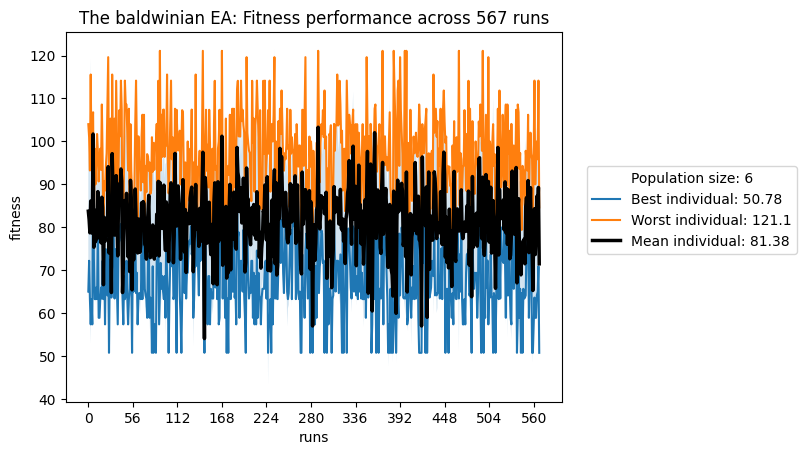

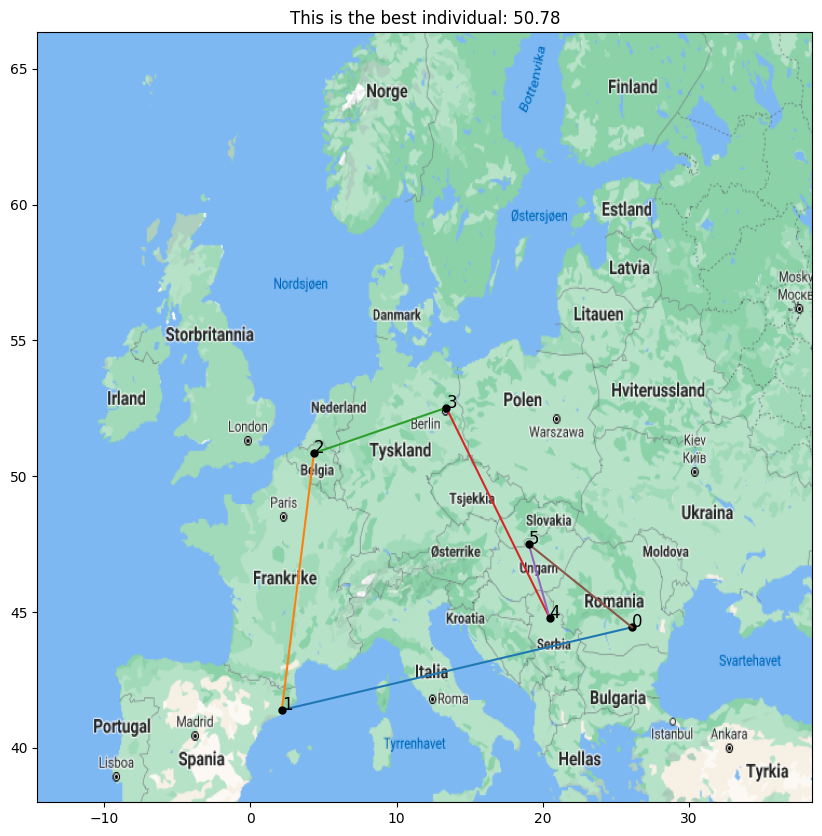

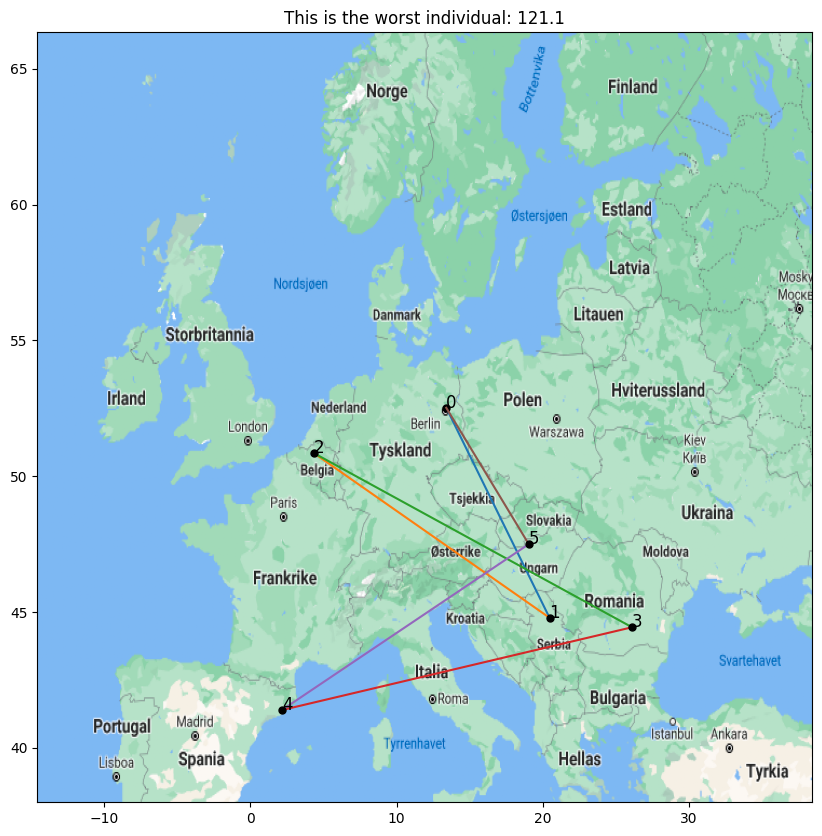

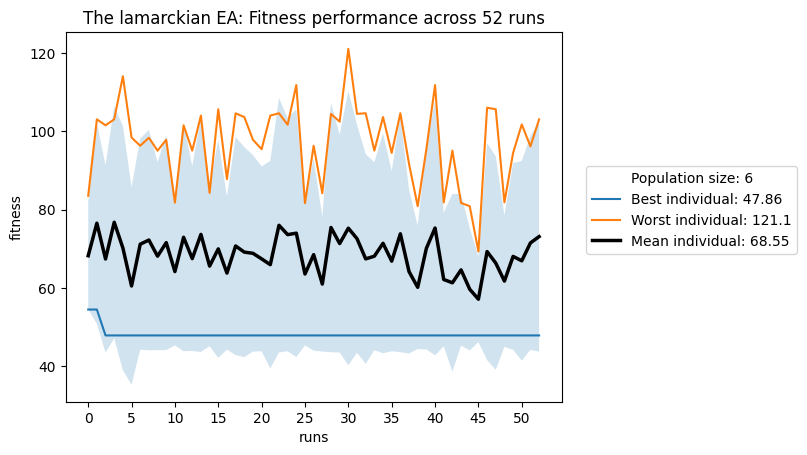

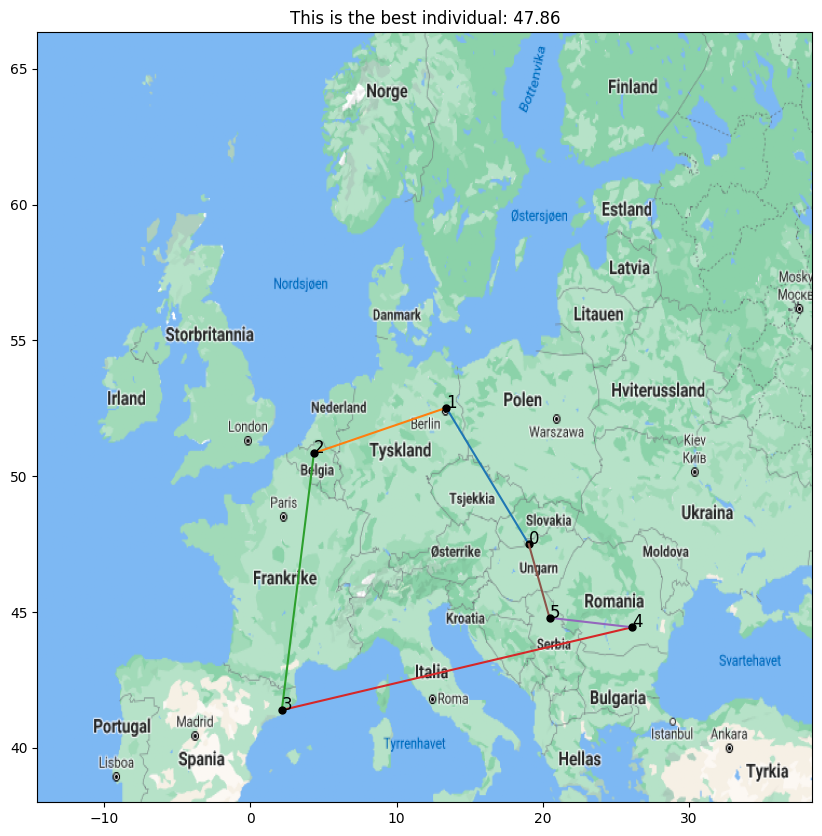

...

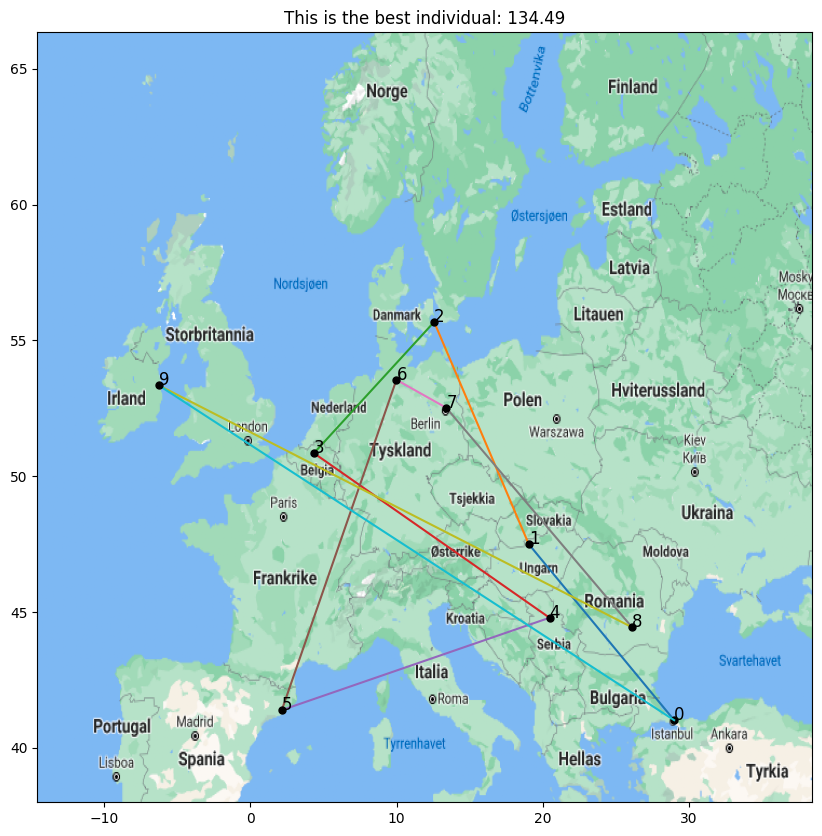

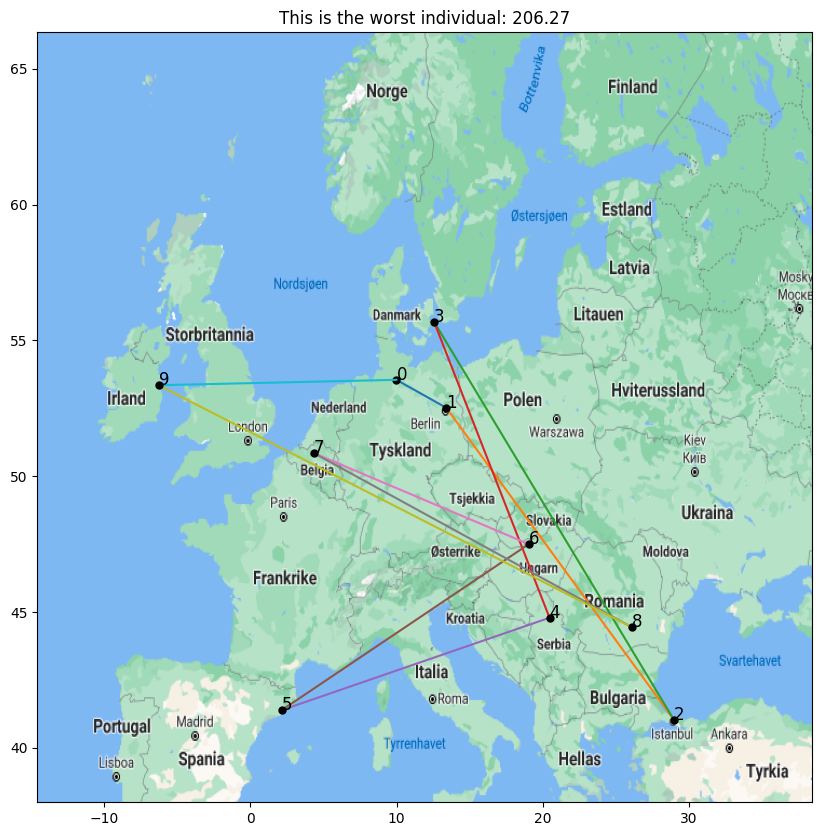

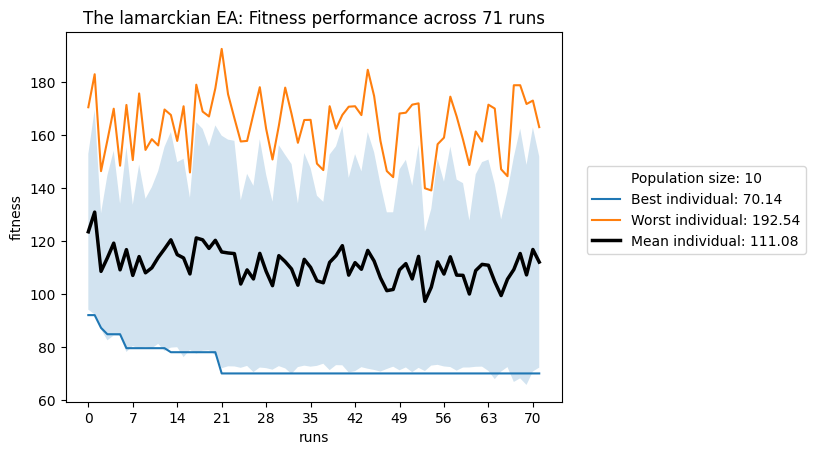

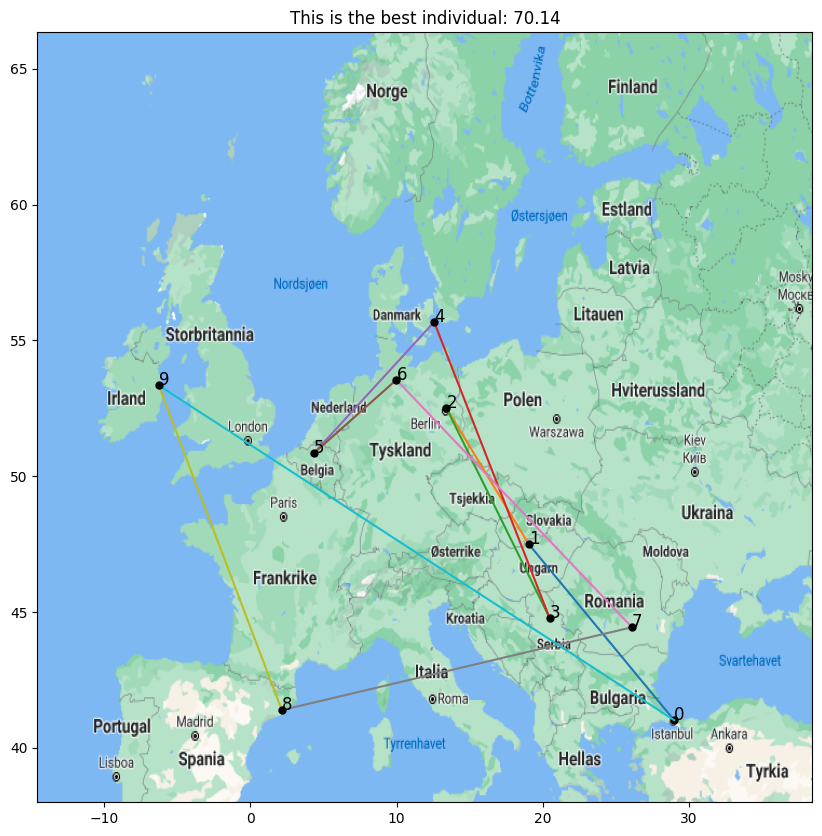

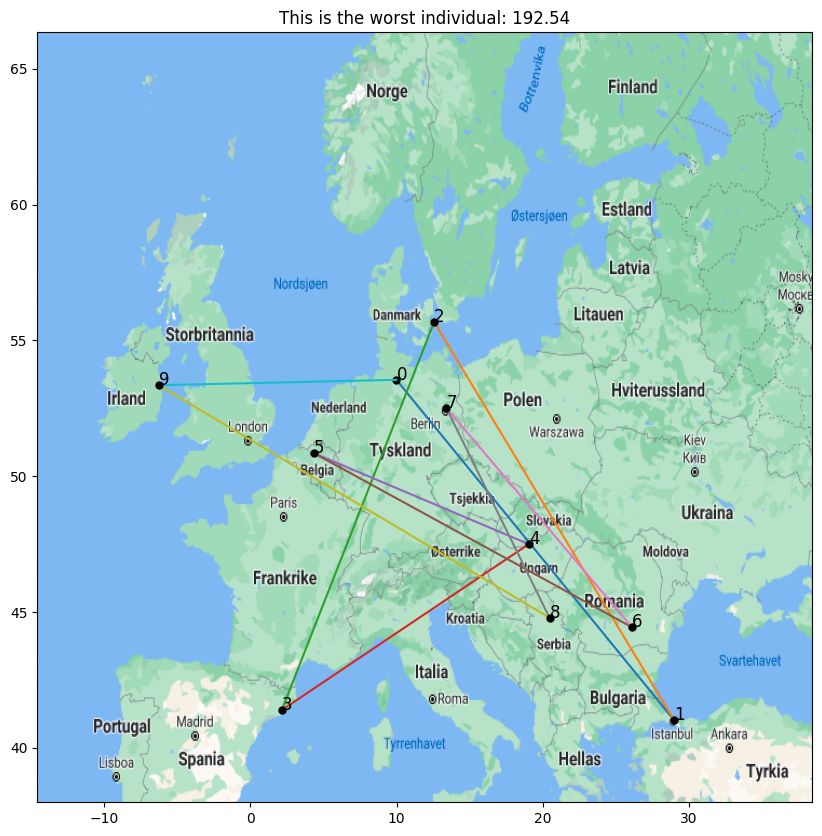

In [23]:
import numpy as np
import statistics
import random
import sys
import math
import matplotlib.pyplot as plt
import time

#Map of Europe
europe_map =plt.imread('map.png')

#Lists of city coordinates
city_coords={"Barcelona":[2.154007, 41.390205], "Belgrade": [20.46,44.79], "Berlin": [13.40,52.52], "Brussels":[4.35,50.85],"Bucharest":[26.10,44.44], "Budapest": [19.04,47.50], "Copenhagen":[12.57,55.68], "Dublin":[-6.27,53.35], "Hamburg": [9.99, 53.55], "Istanbul": [28.98, 41.02], "Kiev": [30.52,50.45], "London": [-0.12,51.51], "Madrid": [-3.70,40.42], "Milan":[9.19,45.46], "Moscow": [37.62,55.75], "Munich": [11.58,48.14], "Paris":[2.35,48.86], "Prague":[14.42,50.07], "Rome": [12.50,41.90], "Saint Petersburg": [30.31,59.94], "Sofia":[23.32,42.70], "Stockholm": [18.06,60.33],"Vienna":[16.36,48.21],"Warsaw":[21.02,52.24]}

# Evaluate fitness of individual
def fitness(Individual):
    Total_dist = 0
    for gene_idx in range(1,len(Individual)-1):
        x1,y1 = city_coords.get(Individual[gene_idx])
        x2,y2 = city_coords.get(Individual[gene_idx+1])
        Distance = math.sqrt((x2-x1)**2 + (y2-y1)**2)
        Total_dist = Total_dist + Distance
    #Add the last position with the first to get the entire route
    x1,y1 = city_coords.get(Individual[len(Individual)-1])
    y1,y2 = city_coords.get(Individual[0])
    Distance = math.sqrt((x2-x1)**2 + (y2-y1)**2)
    Total_dist = Total_dist + Distance
    return round(Total_dist,2)

# Random generation of population of solution sets
def Starting_population(Size):
    cities = list(city_coords.keys())[:Size]
    population = []
    while len(population) < Size:
        new_combination = list(random.sample(cities, len(cities)))
        if new_combination not in population:
            population.append(new_combination)
    # Assign values that determine prob of becoming parent based on rank
    for Individual in range(0,len(population)):
        fitness_scr = fitness(population[Individual])
        population[Individual] = [fitness_scr,population[Individual]]
    population.sort(key = lambda x: x[0])
    return population

# Generate parents with order selection probability
def Select_parents(population):
    # Define probability to create order
    parents = []
    idx = 0
    while len(parents) <= len(population)//2:
        prob_select = 0.9
        x = random.random()
    #Select parent if x < 0.9
        if x < prob_select:
            parent1 = population[idx]
            parents.append(parent1)
            if parent1 == population[idx+1]:
                parent2 = population[idx+2]
                parents.append(parent2)
            parents.append(population[idx+1])
        if len(parents) >= len(population)//2:
            break
        idx = idx + 2
        if idx >= len(population)-2:
            idx = 0
    return parents

def stochastic_hill_climber(parent,population,type_):
    #Find the index of parent
    for el in range(0,len(population)-1):
        if population[el][1] == parent:
            OG_par_idx = el
    OG_parent = parent
    parent1 = parent
    OG_fit = fitness(OG_parent)
    #Generate random gene for swapping with neighbours if fitness improves
    x = random.randint(0,len(parent1)-2)
    parent_options = list()
    for elem in range(0,len(parent1)-1):
        if elem != x:
            parent1[elem], parent1[x] = parent1[x], parent1[elem]
            if fitness(parent1) < OG_fit:
                parent_options.append(parent)
    if not parent_options:
        parent1 = OG_parent
    else:
        parent1 = random.choice(parent_options)
        if type_ == 'baldwinian':
            Nu_par_fit = fitness(parent1)
            population[OG_par_idx][0] = Nu_par_fit
            parent1 = OG_parent
    return parent1, population

def PMX(parent1, parent2, change_size, type_, population): # THIS FUNCTION WAS RETRIEVED FROM WEEK 3 EXERCISE FOR PARTIALLY MAPPED CROSSOVER
    #Create offspring genome and their respective slicing indices based on percentage of parental size
    parent1, population = stochastic_hill_climber(parent1,population, type_)
    parent2, population = stochastic_hill_climber(parent2,population, type_)
    idx_start = np.random.randint(0,len(parent1)-(math.ceil(len(parent1)*change_size))-1)
    if idx_start+1 >= ((idx_start+math.ceil(len(parent1)*change_size))+1):
        idx_stop = (idx_start+math.ceil(len(parent1)*change_size))+1
    else:
        idx_stop = np.random.randint((idx_start + 1),(idx_start+math.ceil(len(parent1)*change_size))+1)
    #Create a relation list that contains the relation between all the middle values
    relations = []
    for y in range(idx_start,idx_stop+1):
        relations.append([parent1[y],parent2[y]]) 
    offspring1 = [0] * len(parent1)
    offspring2 = offspring1.copy()
    offspring1[idx_start:idx_stop+1] = parent2[idx_start:idx_stop+1]
    offspring2[idx_start:idx_stop+1] = parent1[idx_start:idx_stop+1]
    idx_list = list(range(0,len(parent1)))
    del idx_list[idx_start:idx_stop+1]
    #Create a function that searches through an array to find the index of the value
    def get_index(val,p):
        for x in range(0,len(relations)):
            if relations[x][p] == val:
                return x
    #Create a function that loops through elements in the other parent and check if it overlaps with the values from the primary parent
    def crossover(offspring):
        #Check if it is p1 or p2:
        if [k for k, v in sys._getframe(1).f_locals.items() if v is offspring][0] == "offspring1":
            p = 0
            parent = parent1
        else:
            p = 1
            parent =  parent2  
        for u in idx_list:
            if parent[u] in offspring:
                p1 = abs(p-1)
                idx = get_index(parent[u],p1)
                if idx != None:
                    if relations[idx][p] not in offspring:
                        offspring[u] = relations[idx][p]
                    else:
                        for _ in range(len(parent1)-(idx_stop-idx_start)):
                            idx = get_index(relations[idx][p],p1)
                            if idx != None:
                                if relations[idx][p] not in offspring:
                                    offspring[u] = relations[idx][p]
                                    break
                            else:
                                break
            elif parent[u] not in offspring:
                offspring[u] = parent[u]
        return offspring
        
    offspring1 = crossover(offspring1)
    offspring2 = crossover(offspring2)
    def swap_random(ls):
        idx = range(len(ls))
        i1, i2 = random.sample(idx, 2)
        ls[i1], ls[i2] = ls[i2], ls[i1]
        return ls
    #offspring1 = swap_random(offspring1)
    #offspring2 = swap_random(offspring2)
    return offspring1, offspring2, population

def CrossAndMutate(parents,x,type_,population):
    offsprings = []
    for parent_idx in range(0,len(parents)-1,2):
        parent1 = parents[parent_idx]
        parent2 = parents[parent_idx+1]
        offspring1, offspring2, population = PMX(parent1[1],parent2[1],x,type_,population)
        offspring1 = [fitness(offspring1),offspring1]
        offspring2 = [fitness(offspring2),offspring2]
        offsprings.append(offspring1)
        offsprings.append(offspring2)
    return offsprings, population

def SurvivorSelection(population,offsprings):
    offsprings.sort(key = lambda x: x[0])
    population.sort(key = lambda x: x[0])
    if len(population) % 2 == 0:
        lim1 = len(population) // 2
        lim2 = len(population) // 2
    else:
        lim1 = len(population) // 2 + 1
        lim2 = len(population) // 2 
    offsprings = offsprings[:lim1]
    population = population[:lim2]
    population = population + offsprings
    population.sort(key = lambda x: x[0])
    return population 

def Generations(size,Gens_limit,type_):
    s1 = time.time()
    population1 = Starting_population(size)
    #Define temperature function to create less change in PMX over generations
    Best_individuals_fit = list()
    Worst_individuals_fit = list()
    All_worst_performer = [0,["t"]]
    Avg_performer_fit = list()
    Std_performer_fit = list()
    Average_fit = list()
    Std_fit = list()
    for run in range(0,1000):
        x = 0.5
        each_bit = 0.4/Gens_limit     
        for gen in range(0,Gens_limit):
            parents = Select_parents(population1)   
            offsprings, population1 = CrossAndMutate(parents,x,type_,population1)
            population1 = SurvivorSelection(population1,offsprings)
            
            Top_performer_fit = population1[0][0]
            Worst_performer_fit = population1[len(population1)-1][0]
            values = [sublist[0] for sublist in population1]
            Avg_performer_fit = round(statistics.mean(values),2)
            Std_performer_fit = round(statistics.stdev(values),2)
            x = x-each_bit
        Worst_performer = population1[len(population1)-1]
        if Worst_performer[0] > All_worst_performer[0]:
            All_worst_performer = Worst_performer
        Best_performer = population1[0]
        Average_fit.append(Avg_performer_fit)
        Best_individuals_fit.append(Top_performer_fit)
        Worst_individuals_fit.append(Worst_performer_fit)
        Std_fit.append(Std_performer_fit)
        if Best_individuals_fit.count(Top_performer_fit) > 50:
            break
    s2 = time.time()
    runtime = s2-s1
    return All_worst_performer, Best_performer, Average_fit, Best_individuals_fit, Worst_individuals_fit, Std_fit, runtime

def plot_runs(Best_individuals_fit,Average_fit,Std_fit,Worst_individuals_fit,sz,type_):
    x = list(range(0,len(Best_individuals_fit)))
    Best = min(Best_individuals_fit)
    Worst = max(Worst_individuals_fit)
    Avg = round(statistics.mean(Average_fit),2)
    plt.plot(x, Best_individuals_fit, label=f"Best individual: {Best}")
    plt.plot(x, Worst_individuals_fit, label=f"Worst individual: {Worst}")
    plt.plot(x, Average_fit, label = f"Mean individual: {Avg}",color='black',linewidth=2.5)
    upper = list()
    lower = list()
    for id in range(0,len(Std_fit)):
        upper.append(Average_fit[id]+Std_fit[id])
        lower.append(Average_fit[id]-Std_fit[id])
    # Plot the mean and standard deviation as a shaded area
    plt.fill_between(x, upper, lower, alpha=0.2)
    plt.ylabel('fitness')
    plt.xlabel('runs')
    space = len(x)//10
    plt.xticks(x[::space])
    plt.title(f"The {type_} EA: Fitness performance across {len(Best_individuals_fit)-1} runs")
    plt.legend(loc=(1.05,0.4),title=f"Population size: {sz}")
    plt.show()
    return

#A method you can use to plot your plan on the map.
def plot_plan(city_order,Score):
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(europe_map, extent=[-14.56,38.43, 37.697 +0.3 , 64.344 +2.0], aspect = "auto")

    # Map (long, lat) to (x, y) for plotting
    for index in range(len(city_order) -1):
        current_city_coords = city_coords[city_order[index]]
        next_city_coords = city_coords[city_order[index+1]]
        x, y = current_city_coords[0], current_city_coords[1]
        #Plotting a line to the next city
        next_x, next_y = next_city_coords[0], next_city_coords[1]
        plt.plot([x,next_x], [y,next_y])
        
        plt.plot(x, y, 'ok', markersize=5)
        plt.text(x, y, index, fontsize=12)
    #Finally, plotting from last to first city
    first_city_coords = city_coords[city_order[0]]
    first_x, first_y = first_city_coords[0], first_city_coords[1]
    plt.plot([next_x,first_x],[next_y,first_y])
    #Plotting a marker and index for the final city
    plt.plot(next_x, next_y, 'ok', markersize=5)
    plt.text(next_x, next_y, index+1, fontsize=12)
    plt.title(Score)
    plt.show()

def RunAndPlot(size1,size2,size3,runs):
    sizes = [size1,size2,size3]
    types = ['baldwinian', 'lamarckian']
    for sz in sizes:
        for type_ in types:
            Worst_performer, Best_performer, Average_fit, Best_individuals_fit, Worst_individuals_fit, Std_fit, runtime = Generations(sz,runs,type_)
            plot_runs(Best_individuals_fit,Average_fit,Std_fit,Worst_individuals_fit,sz,type_)
            plot_plan(Best_performer[1],f"This is the best individual: {Best_performer[0]}")
            plot_plan(Worst_performer[1],f"This is the worst individual: {Worst_performer[0]}")
    return

RunAndPlot(6,8,10,100)